In [1]:
from scipy import spatial
import numpy as np
import cv2 as cv
import scipy.io as sio
import os, sys

sys.path.append('..')

from extractEmbeddings import featureExtractor
from utils import datasetUtils

import tensorflow as tf

%matplotlib inline
import matplotlib.pyplot as plt

setGPU: Setting GPU to: 1


/home/vuu/anaconda3/envs/tfpy3_exp/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:516: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint8 = np.dtype([("qint8", np.int8, 1)])
/home/vuu/anaconda3/envs/tfpy3_exp/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:517: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_quint8 = np.dtype([("quint8", np.uint8, 1)])
/home/vuu/anaconda3/envs/tfpy3_exp/lib/python3.7/site-packages/tensorflow/python/framework/dtypes.py:518: FutureWarning: Passing (type, 1) or '1type' as a synonym of type is deprecated; in a future version of numpy, it will be understood as (type, (1,)) / '(1,)type'.
  _np_qint16 = np.dtype([("qint16", np.int16, 1)])
/home/vuu/anaconda3/envs/tfpy3_exp/lib/python3

In [2]:
# setting the model type and loading the pre-trained model
modelType = 'InceptionV3'
featExtract = featureExtractor(1000, modelType)
model = featExtract.pretrainedModel()

Instructions for updating:
Call initializer instance with the dtype argument instead of passing it to the constructor


In [3]:
print('feature extraction of single title')
title_path = '../../../data/movie_titles/81671'
featureVectors, fileNames = featExtract.extractFeaturesTitle(title_path, model)
#matFilePath = '../../../data/movie_titles/81671ENpreprcoess.mat'#os.path.join('../../../data/movie_titles/81671ENpreprcoess.mat', matFileName)
#sio.savemat(matFilePath, {'featureVectors':fvs, 'fileNames':fileNames})

feature extraction of single title


In [6]:
len(featureVectors)

50

In [7]:
#Clean the dataset (remove in case if the file is not image)
dataPath = '../../../data/movie_titles/all_titles_uncompressed/'
dataClean = datasetUtils()
#dataClean.nonImages(dataPath)

In [5]:
path = '../../../data/movie_titles/81671Inc.mat'
featureVectors, fileNames = dataClean.loadMatFile(path)
print(len(featureVectors), featureVectors[0].shape, type(featureVectors), type(fileNames))

83675 (1, 2048) <class 'numpy.ndarray'> <class 'numpy.ndarray'>


In [ ]:
filePath = '../../../data/movie_titles/all_titles_uncompressed/81671/'

In [4]:
def displayImage(path, name):
    img = cv.imread(path)
    plt.axis('off')
    plt.title(name)
    plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.show()

In [4]:
isAE = False #set True if you want to test with AE models

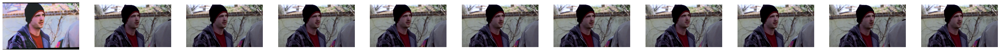

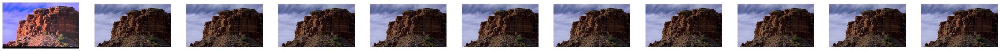

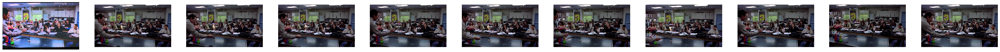

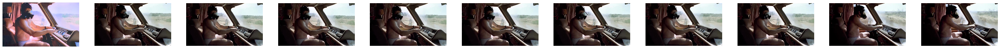

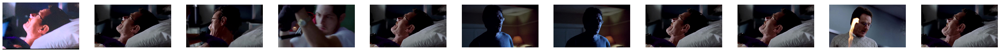

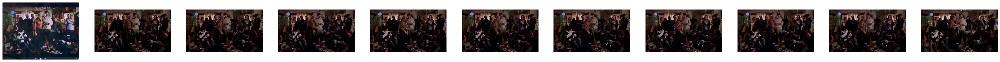

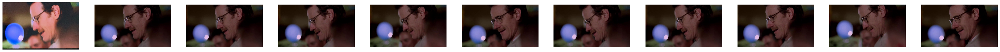

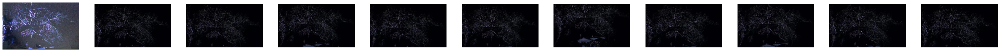

In [5]:
#testImagePath = '../../data/movie_titles/testUncompressed/5454-77-146-160/146.jpg'

#append all the test cases that we want to test
testCases = []
testCases.append('../../../data/movie_titles/testUncompressed/710892EE-71C2-424A-8C8E-B932650D0C8D/0.jpg')
testCases.append('../../../data/movie_titles/testUncompressed/BA4C126E-C1FB-4D3B-B005-EAC8FB1D8AE6/0.jpg')
testCases.append('../../../data/movie_titles/testUncompressed/A87CF0B8-B7CB-4966-974E-08EA74DCEC7E/0.jpg')
testCases.append('../../../data/movie_titles/testUncompressed/355B709B-C088-41F3-BAD2-5C5815753B69/0.jpg')
testCases.append('../../../data/movie_titles/testUncompressed/DD9D94DE-F340-4BC0-8A81-7688C43E3384/0.jpg')
testCases.append('../../../data/movie_titles/testUncompressed/007A7335-5CD9-4549-B8BD-6F9D090C7367/0.jpg')
testCases.append('../../../data/movie_titles/testUncompressed/FEEEDE0D-FD34-4517-A690-C2F04E3739BE/0.jpg')
testCases.append('../../../data/movie_titles/testUncompressed/661AD029-A96F-427F-99B7-2C44E01027EF/0.jpg')
 
nRows = len(testCases)
nCols = 11 #Query frame and first 10 best matches
for testCase in testCases:
    plt.figure(figsize=(50, 40))
    
    qFv = featExtract.extractFeaturesFile(testCase, model)
    img = cv.imread(testCase)
    img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
    iInd = 1
    plt.subplot(nRows, nCols, iInd)
    plt.axis('off')
    plt.imshow(img)

    resDiffList = []
    for srcFv in featureVectors:
        if isAE:
            sfv = np.reshape(srcFv, srcFv.shape[1]*srcFv.shape[2]*srcFv.shape[3])
            res = spatial.distance.cosine(queryFeatureVector, sfv)
        else:
            res = spatial.distance.cosine(qFv, srcFv)
        resDiffList.append(res)
    
    npResArr = np.array(resDiffList)
    origIndexes = np.argsort(npResArr)

    count = 0
    for ind in origIndexes:
        filePath = fileNames[ind].rstrip() #Remove space at the right side of the file path
        #filePath = '../'+filePath
        if not os.path.exists(filePath):
            print("file path does not exists", filePath)
            break
        score = resDiffList[ind]
        
        img = cv.imread(filePath)
        img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
        plt.subplot(nRows, nCols, iInd+count+1)
        plt.axis('off')
        plt.imshow(img)
        count += 1
        if count > 9:
            break
            
    plt.show()

In [7]:
from sklearn.cluster import KMeans, DBSCAN
import shutil

In [8]:
np.set_printoptions(threshold=sys.maxsize)

In [9]:
#Append all the mat files
count = 0
for title in os.listdir(dataPath):
    titlePath = os.path.join(dataPath, title)
    matFile = title + 'ENB5.mat'
    matFilePath = os.path.join(titlePath, matFile)
    if not os.path.exists(matFilePath):
        print(matFilePath)
        
    if count == 0:
        concatFvs, concatFileNames = dataClean.loadMatFile(matFilePath)
    else:
        currFvs, currFileNames = dataClean.loadMatFile(matFilePath)
        #concatFvs = np.concatenate((concatFvs, currFvs))
        concatFileNames = np.concatenate((concatFileNames, currFileNames))
    
    count += 1
    if count > 100:
        break
        
print(concatFileNames.shape)

(5606922,)


In [10]:
matFilePath = '../../../data/movie_titles/all_titles_uncompressed/81671/81671ENB5.mat'
fvs, fNames = dataClean.loadMatFile(path)
print(fvs.shape, fNames.shape)

(83675, 1, 2048) (83675,)


In [11]:
fvs = np.squeeze(fvs)

#kmeans = KMeans(n_clusters=20, random_state=0).fit(fvs) #KMeans
dbscan = DBSCAN(eps=0.01, min_samples=24, metric='cosine').fit(fvs)

In [13]:
print("\n")
targetdir = '../../../../../data/clustering/1501201'
for i, m in enumerate(dbscan.labels_):
    print("    Copy: %s / %s" %(i, len(dbscan.labels_)), end="\r")
    fname = '../'+fNames[i].rstrip()
    #print(fname, i, m)
    #displayImage(fname, 'orig')
    targetpath = os.path.join(targetdir, str(m))
    if not os.path.exists(targetpath):
        os.makedirs(targetpath)
    fileName = str(i)+'.jpg'
    dstFileName = os.path.join(targetpath, fileName)
    shutil.copy(fname, dstFileName)
    #if m != 1:
    #    break

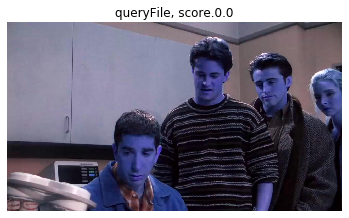

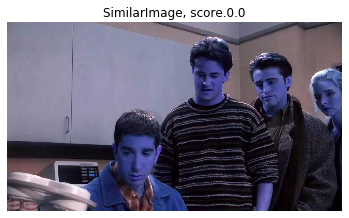

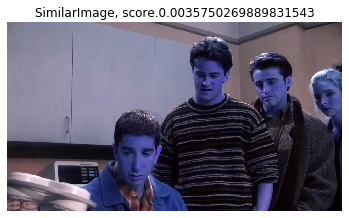

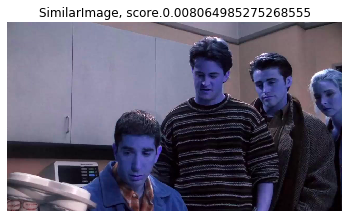

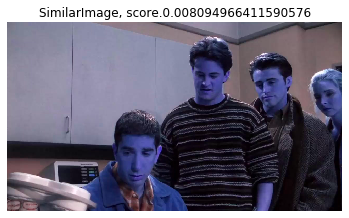

...

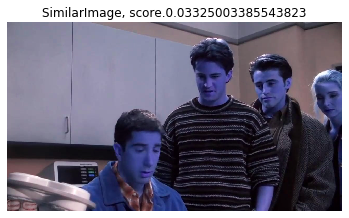

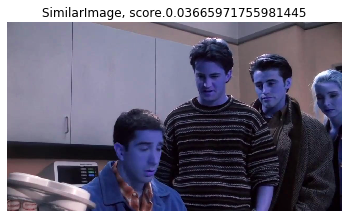

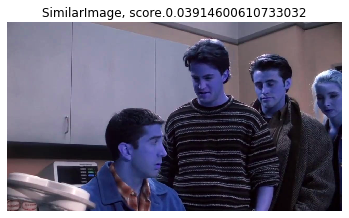

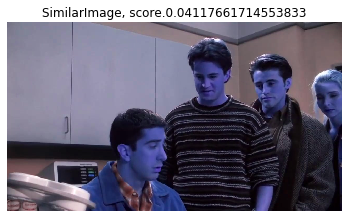

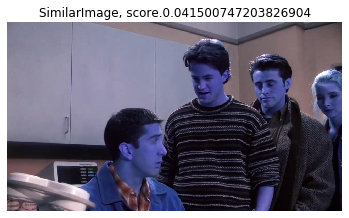

In [5]:
rndInd = np.random.randint(0, 18000)
queryFeatureVector = featureVectors[rndInd]
resDiffList = []
for srcFv in featureVectors:
    res = spatial.distance.cosine(queryFeatureVector, srcFv)
    resDiffList.append(res)
    
npResArr = np.array(resDiffList)
origIndexes = np.argsort(npResArr)

qFilePath = fileNames[rndInd]
score = resDiffList[rndInd]
displayImage(qFilePath, "queryFile, score.{}".format(score))

count = 0
for ind in origIndexes:
    filePath = fileNames[ind]
    score = resDiffList[ind]
    displayImage(filePath, "SimilarImage, score.{}".format(score))
    count += 1
    if count > 50:
        break